In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/dataset.yaml
/kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/labels/val/1_130_50_0_07210.txt
/kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/labels/val/1_60_50_0_00319.txt
/kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/labels/val/1_60_50_0_00284.txt
/kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/labels/val/0_60_50_0_01706.txt
/kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/labels/val/0_120_30_0_05331.txt
/kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/labels/val/0_100_50_0_08138.txt
/kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/labels/val/1_60_60_0_00481.txt
/kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/labels/val/0_70_60_0_01967.txt
/kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/labels/val/1_90_80_0_05034.txt
/kaggle/input/h

In [2]:
!pip install -q ultralytics imutils

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 62.0/62.0 kB 3.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 20.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 16.8/16.8 MB 109.7 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 363.4/363.4 MB 5.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 13.8/13.8 MB 112.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 24.6/24.6 MB 81.6 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 883.7/883.7 kB 50.3 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 664.8/664.8 MB 2.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 211.5/211.5 MB 5.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 56.3/56.3 MB 31.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 127.9/127.9 MB 10.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 207.5/207.5 MB 2.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━

In [3]:
from tqdm.auto import tqdm

import os
import requests
import zipfile
import cv2
import math
import matplotlib.pyplot as plt
import glob
import numpy as np
import random

from PIL import Image

In [4]:
ROOT_DIR = '/kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav'
train_imgs_dir = 'images/train'
train_labels_dir = 'labels/train'
val_imgs_dir = 'images/val'
val_labels_dir = 'labels/val'
test_imgs_dir = 'images/test'
test_labels_dir = 'labels/test'
classes = ['Person', 'Car', 'Bicycle', 'OtherVechicle', 'DontCare']
colors = np.random.uniform(0, 255, size=(len(classes), 3))

In [5]:
# Function to convert bounding boxes in YOLO format to xmin, ymin, xmax, ymax.
def yolo2bbox(bboxes):
    xmin, ymin = bboxes[0]-bboxes[2]/2, bboxes[1]-bboxes[3]/2
    xmax, ymax = bboxes[0]+bboxes[2]/2, bboxes[1]+bboxes[3]/2
    return xmin, ymin, xmax, ymax

In [6]:
def plot_box(image, bboxes, labels, classes=classes, colors=colors, pos='above'):
    # Need the image height and width to denormalize
    # the bounding box coordinates
    height, width, _ = image.shape
    lw = max(round(sum(image.shape) / 2 * 0.003), 2)  # Line width.
    tf = max(lw - 1, 1) # Font thickness.
    for box_num, box in enumerate(bboxes):
        x1, y1, x2, y2 = yolo2bbox(box)
        # denormalize the coordinates
        xmin = int(x1*width)
        ymin = int(y1*height)
        xmax = int(x2*width)
        ymax = int(y2*height)

        p1, p2 = (int(xmin), int(ymin)), (int(xmax), int(ymax))
        
        class_name = classes[int(labels[box_num])]

        color=colors[classes.index(class_name)]
        
        cv2.rectangle(
            image, 
            p1, p2,
            color=color, 
            thickness=lw,
            lineType=cv2.LINE_AA
        ) 

        # For filled rectangle.
        w, h = cv2.getTextSize(
            class_name, 
            0, 
            fontScale=lw / 3, 
            thickness=tf
        )[0]

        outside = p1[1] - h >= 3
        
        if pos == 'above':
            p2 = p1[0] + w, p1[1] - h - 3 if outside else p1[1] + h + 3
            cv2.rectangle(
                image, 
                p1, p2, 
                color=color, 
                thickness=-1, 
                lineType=cv2.LINE_AA
            )  
            cv2.putText(
                image, 
                class_name, 
                (p1[0], p1[1] - 5 if outside else p1[1] + h + 2),
                cv2.FONT_HERSHEY_SIMPLEX, 
                fontScale=lw/3.5, 
                color=(255, 255, 255), 
                thickness=tf, 
                lineType=cv2.LINE_AA
            )
        else:
            new_p2 = p1[0] + w, p2[1] + h + 3 if outside else p2[1] - h - 3
            cv2.rectangle(
                image, 
                (p1[0], p2[1]), new_p2, 
                color=color, 
                thickness=-1, 
                lineType=cv2.LINE_AA
            )  
            cv2.putText(
                image, 
                class_name, 
                (p1[0], p2[1] + h + 2 if outside else p2[1]),
                cv2.FONT_HERSHEY_SIMPLEX, 
                fontScale=lw/3, 
                color=(255, 255, 255), 
                thickness=tf, 
                lineType=cv2.LINE_AA
            )
    return image

In [7]:
# Function to plot images with the bounding boxes.
def plot(image_path, label_path, num_samples, classes=classes, colors=colors, pos='above'):
    all_training_images = glob.glob(image_path+'/*')
    all_training_labels = glob.glob(label_path+'/*')
    all_training_images.sort()
    all_training_labels.sort()
    
    temp = list(zip(all_training_images, all_training_labels))
    random.shuffle(temp)
    all_training_images, all_training_labels = zip(*temp)
    all_training_images, all_training_labels = list(all_training_images), list(all_training_labels)
    
    num_images = len(all_training_images)
    
    if num_samples == -1:
        num_samples = num_images
    
    num_cols = 2
    num_rows = int(math.ceil(num_samples / num_cols))
        
    plt.figure(figsize=(10 * num_cols, 6 * num_rows))
    for i in range(num_samples):
        image_name = all_training_images[i].split(os.path.sep)[-1]
        image = cv2.imread(all_training_images[i])
        with open(all_training_labels[i], 'r') as f:
            bboxes = []
            labels = []
            label_lines = f.readlines()
            for label_line in label_lines:
                label, x_c, y_c, w, h = label_line.split(' ')
                x_c = float(x_c)
                y_c = float(y_c)
                w = float(w)
                h = float(h)
                bboxes.append([x_c, y_c, w, h])
                labels.append(label)
        result_image = plot_box(image, bboxes, labels, classes, colors, pos)
        plt.subplot(num_rows, num_cols, i+1) # Visualize 2x2 grid of images.
        plt.imshow(image[:, :, ::-1])
        plt.axis('off')
    plt.tight_layout()
    plt.show()

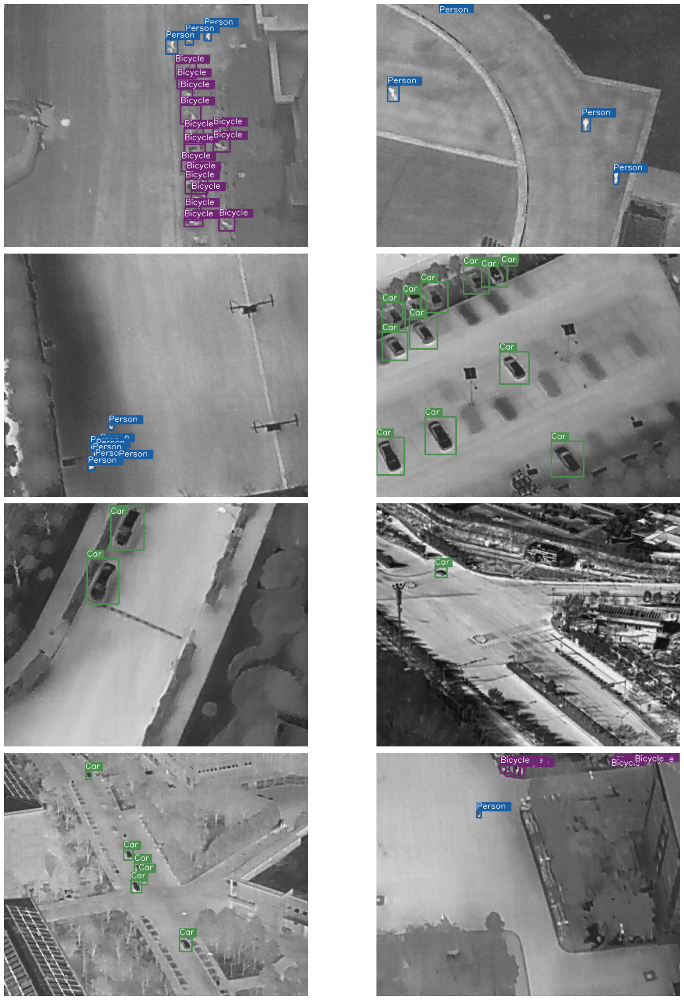

In [8]:
# Visualize a few training images.
plot(
    image_path=os.path.join(ROOT_DIR, train_imgs_dir), 
    label_path=os.path.join(ROOT_DIR, train_labels_dir),
    num_samples=8
)

In [9]:
import yaml

# 1. Tạo file dataset.yaml
data_dict = {
    "train": "/kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/images/train",
    "val": "/kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/images/val",
    "test": "/kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/images/test",
    "nc": 5,
    "names": ['Person', 'Car', 'Bicycle', 'OtherVehicle', 'DontCare']
}

with open("dataset.yaml", "w") as f:
    yaml.dump(data_dict, f, sort_keys=False)


# 2. Tạo file model config (Sửa phần Backbone)
model_dict = {
    "nc": 5, 
    
    "backbone": [
        # [from, repeats, module, args]
        
        # --- THAY ĐỔI Ở ĐÂY: Đổi "convnext_tiny" thành "convnext_small" ---
        # ConvNeXt-Small output channels cuối cùng vẫn là 768 giống Tiny
        [-1, 1, "TorchVision", [768, "convnext_small", "DEFAULT", True, 2, True]], # ### <--- ĐÃ SỬA
        
        [-1, 1, "nn.Identity", []], 
        [-1, 1, "nn.Identity", []], 

        # ------ P3 Branch (Target: 256 channels)
        # ConvNeXt-Small Stage 2 cũng có 192 channels -> Giữ nguyên
        [0, 1, "Index", [192, 4]], 
        [-1, 1, "Conv", [256, 1, 1]], 
        [-1, 1, "nn.Identity", []], # index 5 (P3)

        # --------- P4 Branch (Target: 512 channels)
        # ConvNeXt-Small Stage 3 cũng có 384 channels -> Giữ nguyên
        [0, 1, "Index", [384, 6]], 
        [-1, 1, "Conv", [512, 1, 1]], 
        [-1, 1, "nn.Identity", []], # index 8 (P4)

        # ------------------------- P5 Branch (Target: 1024 channels)
        # ConvNeXt-Small Stage 4 cũng có 768 channels -> Giữ nguyên
        [0, 1, "Index", [768, 8]], 
        [-1, 1, "Conv", [1024, 1, 1]], 
        [-1, 1, "SPPF", [1024, 5]] # index 11 (P5)
    ],
    "head": [
        # Phần Head giữ nguyên hoàn toàn
        [-1, 1, "nn.Upsample", [None, 2, "nearest"]],
        [[-1, 8], 1, "Concat", [1]], 
        [-1, 3, "C2f", [512, True]], # index 14

        [-1, 1, "nn.Upsample", [None, 2, "nearest"]],
        [[-1, 5], 1, "Concat", [1]], 
        [-1, 3, "C2f", [256, True]], # index 17 (Output P3)

        [-1, 1, "Conv", [256, 3, 2]],
        [[-1, 14], 1, "Concat", [1]], 
        [-1, 3, "C2f", [512, True]], # index 20 (Output P4)

        [-1, 1, "Conv", [512, 3, 2]],
        [[-1, 11], 1, "Concat", [1]], 
        [-1, 3, "C2f", [1024, True]], # index 23 (Output P5)

        [[17, 20, 23], 1, "Detect", ["nc"]] 
    ]
}

with open("yolov8-custom.yaml", "w") as f:
    yaml.dump(model_dict, f, sort_keys=False)

print("Đã tạo file yolov8-custom.yaml với backbone ConvNeXt-Small thành công!")

Đã tạo file yolov8-custom.yaml với backbone ConvNeXt-Small thành công!


In [10]:
from ultralytics import YOLO

yolo_efficientnet_model = YOLO('/kaggle/working/yolov8-custom.yaml')

Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.


Downloading: "https://download.pytorch.org/models/convnext_small-0c510722.pth" to /root/.cache/torch/hub/checkpoints/convnext_small-0c510722.pth
100%|██████████| 192M/192M [00:00<00:00, 203MB/s]


In [11]:
yolo_efficientnet_train = yolo_efficientnet_model.train(data="/kaggle/working/dataset.yaml", epochs=40, batch = 8)

Ultralytics 8.3.233 🚀 Python-3.11.13 torch-2.6.0+cu124 CUDA:0 (Tesla P100-PCIE-16GB, 16269MiB)
engine/trainer: agnostic_nms=False, amp=True, augment=False, auto_augment=randaugment, batch=8, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=/kaggle/working/dataset.yaml, degrees=0.0, deterministic=True, device=None, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, embed=None, epochs=40, erasing=0.4, exist_ok=False, fliplr=0.5, flipud=0.0, format=torchscript, fraction=1.0, freeze=None, half=False, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, imgsz=640, int8=False, iou=0.7, keras=False, kobj=1.0, line_width=None, lr0=0.01, lrf=0.01, mask_ratio=4, max_det=300, mixup=0.0, mode=train, model=/kaggle/working/yolov8-custom.yaml, momentum=0.937, mosaic=1.0, multi_scale=False, name=train, nbs=64, nms=False, opset=None, optimize=False, optimizer=auto, overlap_mask=True, patience=100, 

/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1
/usr/local/lib/python3.11/dist-packages/matplotlib/colors.py:721: RuntimeWarning: invalid value encountered in less
  xa[xa < 0] = -1


                   all        287       2460      0.787      0.755       0.79      0.526
                Person        171       1168      0.882      0.892      0.919      0.511
                   Car        136        719       0.95      0.974       0.99      0.769
               Bicycle         53        554       0.87      0.871      0.916      0.556
          OtherVehicle          9         12      0.873       0.75      0.801      0.675
              DontCare          5          7      0.358      0.286      0.325      0.119
Speed: 0.1ms preprocess, 64.6ms inference, 0.0ms loss, 0.9ms postprocess per image
Results saved to /kaggle/working/runs/detect/train


In [12]:
best_efficientnet_model = YOLO('/kaggle/working/runs/detect/train/weights/best.pt')

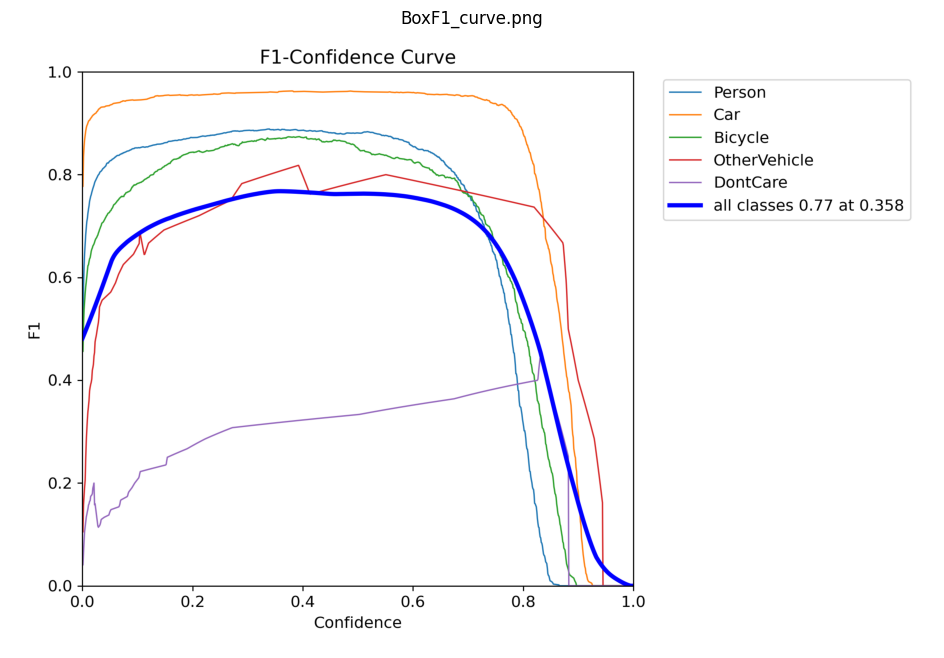

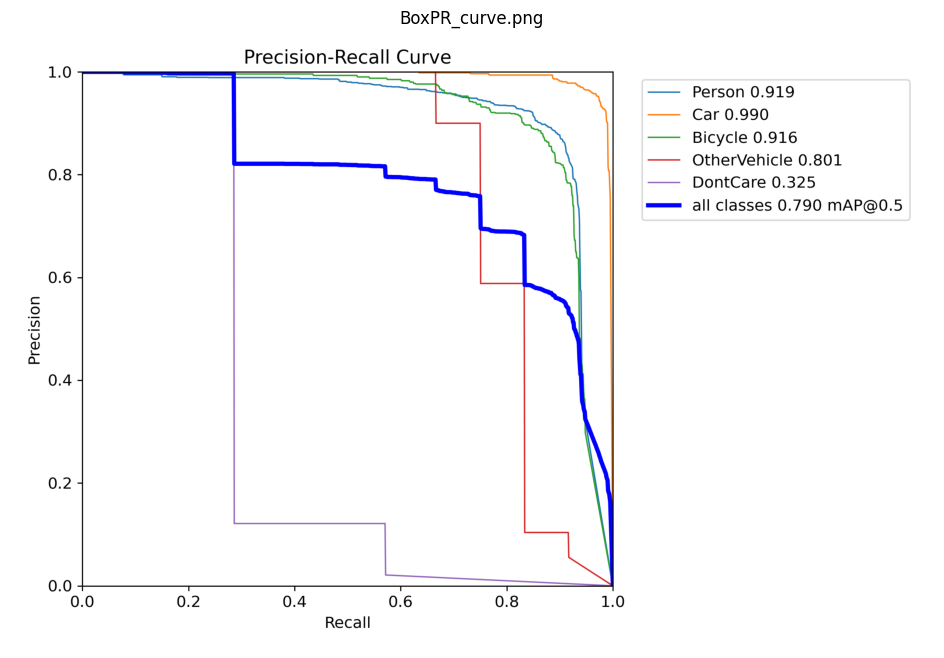

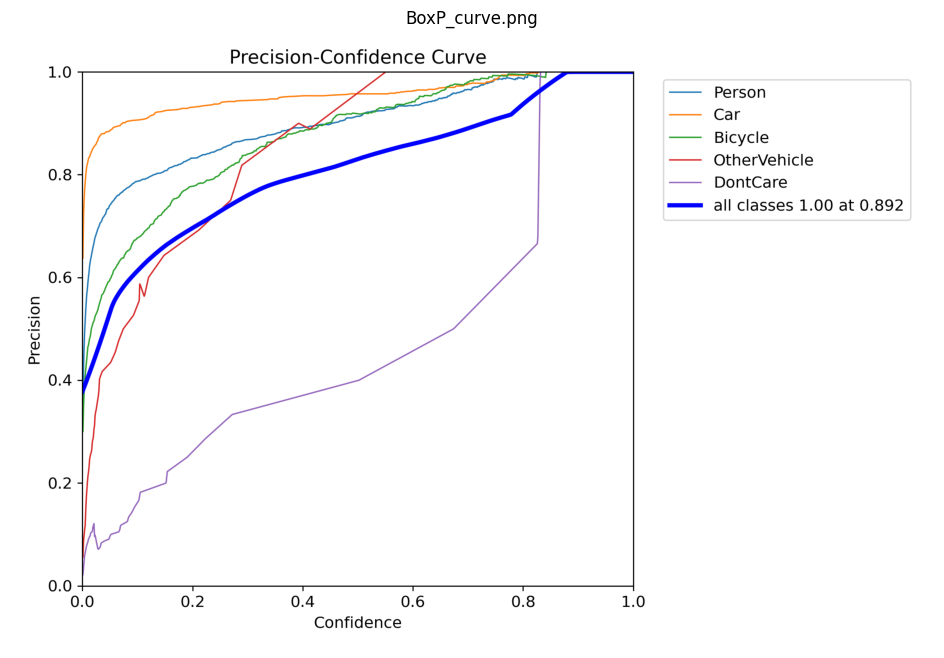

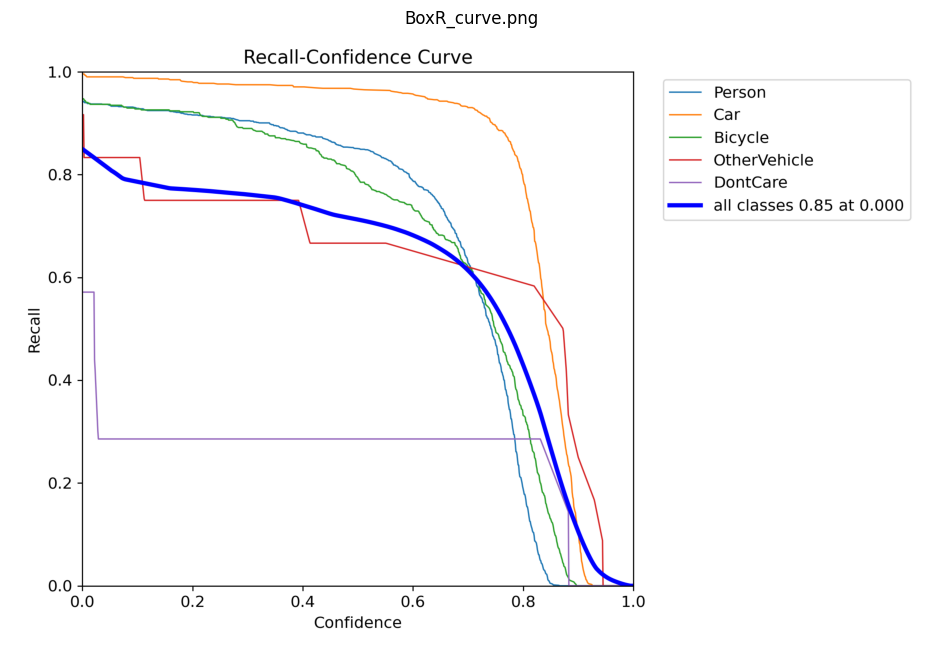

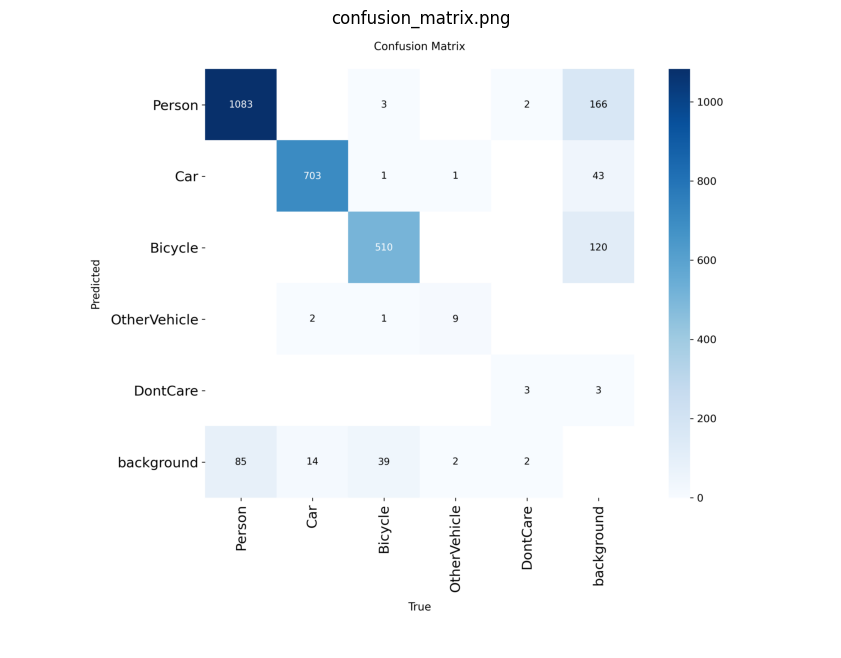

...

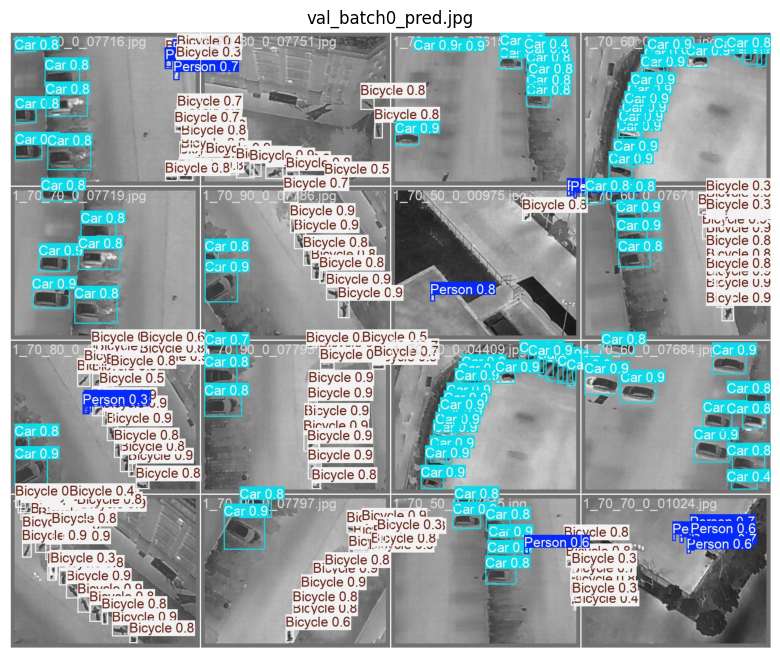

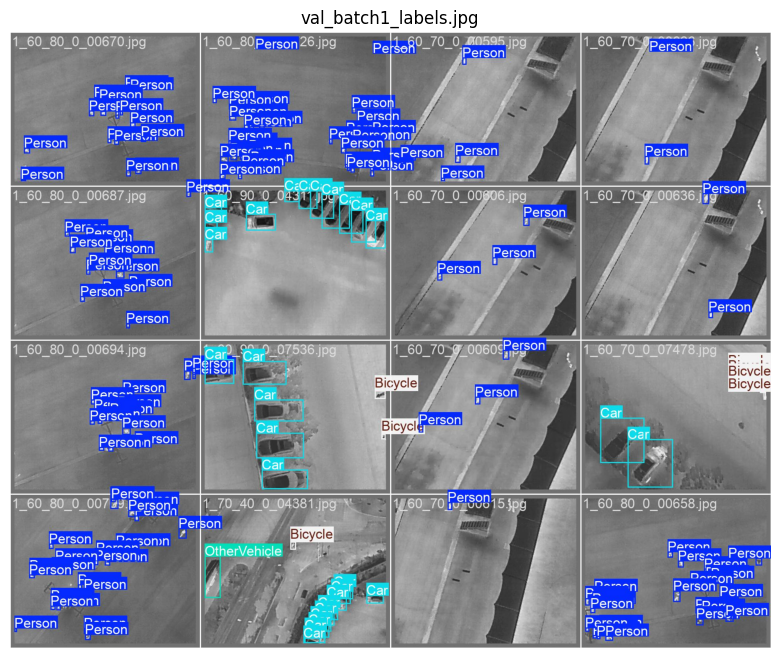

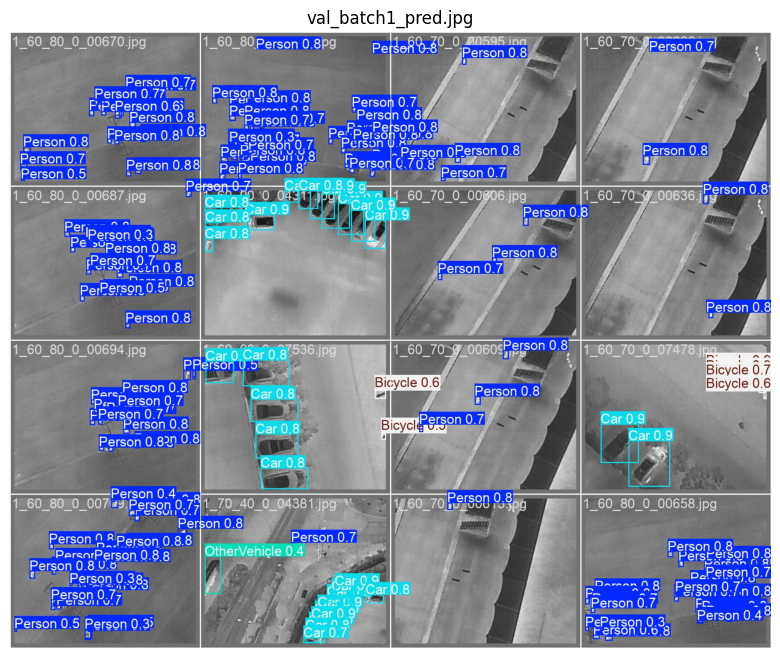

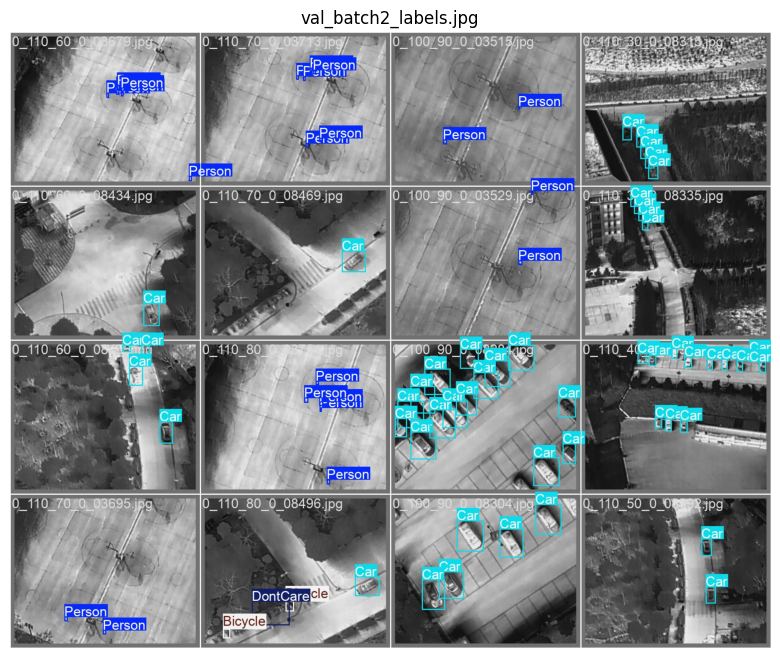

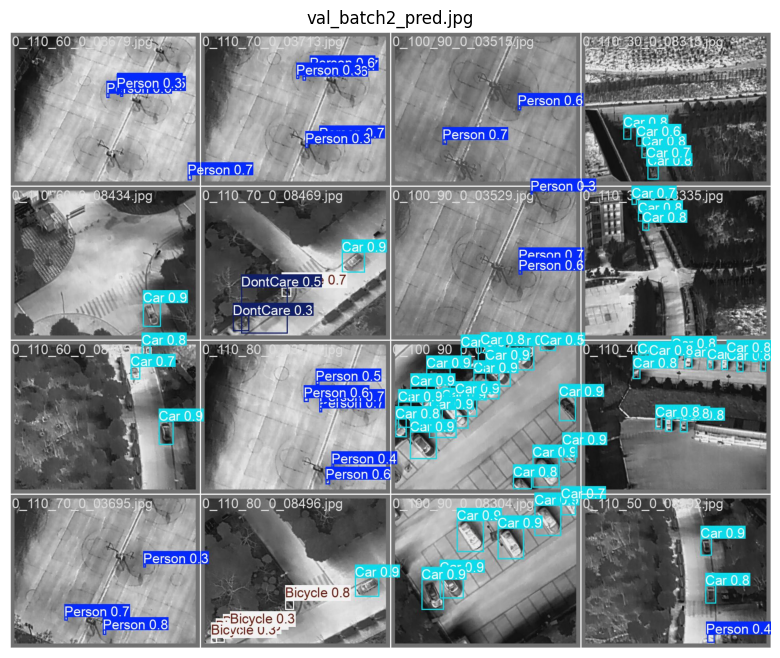

In [13]:
from imutils import paths

log_dir = "/kaggle/working/runs/detect/train"
for image_path in sorted(paths.list_images(log_dir)):
    image = Image.open(image_path)
    plt.figure(figsize=(12, 8))
    plt.imshow(image)
    plt.title(os.path.basename(image_path))
    plt.axis('off')
    plt.show()

In [14]:
!zip -r /kaggle/working/runs.zip runs/

  adding: runs/ (stored 0%)
  adding: runs/detect/ (stored 0%)
  adding: runs/detect/train/ (stored 0%)
  adding: runs/detect/train/train_batch1.jpg (deflated 5%)
  adding: runs/detect/train/confusion_matrix.png (deflated 25%)
  adding: runs/detect/train/val_batch1_labels.jpg (deflated 8%)
  adding: runs/detect/train/confusion_matrix_normalized.png (deflated 21%)
  adding: runs/detect/train/train_batch7530.jpg (deflated 9%)
  adding: runs/detect/train/val_batch0_pred.jpg (deflated 5%)
  adding: runs/detect/train/weights/ (stored 0%)
  adding: runs/detect/train/weights/last.pt (deflated 9%)
  adding: runs/detect/train/weights/best.pt (deflated 9%)
  adding: runs/detect/train/labels.jpg (deflated 27%)
  adding: runs/detect/train/val_batch0_labels.jpg (deflated 7%)
  adding: runs/detect/train/BoxF1_curve.png (deflated 7%)
  adding: runs/detect/train/train_batch7532.jpg (deflated 16%)
  adding: runs/detect/train/results.csv (deflated 61%)
  adding: runs/detect/train/val_batch2_pred.jpg (de

In [15]:
!ls -lh /kaggle/working/


total 349M
-rw-r--r-- 1 root root  325 Nov 29 17:00 dataset.yaml
---------- 1 root root  16M Nov 30 04:07 __notebook__.ipynb
drwxr-xr-x 3 root root 4.0K Nov 29 17:00 runs
-rw-r--r-- 1 root root 329M Nov 30 04:07 runs.zip
-rw-r--r-- 1 root root 5.4M Nov 29 17:00 yolo11n.pt
-rw-r--r-- 1 root root 1.2K Nov 29 17:00 yolov8-custom.yaml


# Inference on Test Images


In [16]:
results = best_efficientnet_model(os.path.join(ROOT_DIR, test_imgs_dir), conf=0.5, agnostic_nms=True, iou=0.5, save=True)


image 1/571 /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/images/test/0_100_30_0_03307.jpg: 512x640 2 Persons, 10 Cars, 53.8ms
image 2/571 /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/images/test/0_100_30_0_08074.jpg: 512x640 7 Cars, 2 OtherVehicles, 45.4ms
image 3/571 /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/images/test/0_100_30_0_08091.jpg: 512x640 13 Cars, 45.3ms
image 4/571 /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/images/test/0_100_30_0_08100.jpg: 512x640 3 Cars, 45.3ms
image 5/571 /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/images/test/0_100_40_0_03327.jpg: 512x640 4 Persons, 45.3ms
image 6/571 /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/images/test/0_100_40_0_03332.jpg: 512x640 2 Persons, 45.3ms
image 7/571 /kaggle/input/hituav-a-highaltitude-infrared-thermal-dataset/hit-uav/images/test/0_100_40_0_03342.jpg: 512x640 5 Persons, 4

In [17]:
import random
import matplotlib.pyplot as plt

def show_random_result(results):
    random_result = random.choice(results)   
    img = random_result.plot()               

    plt.figure(figsize=(10, 8))
    plt.imshow(img)
    plt.axis("off")
    plt.show()




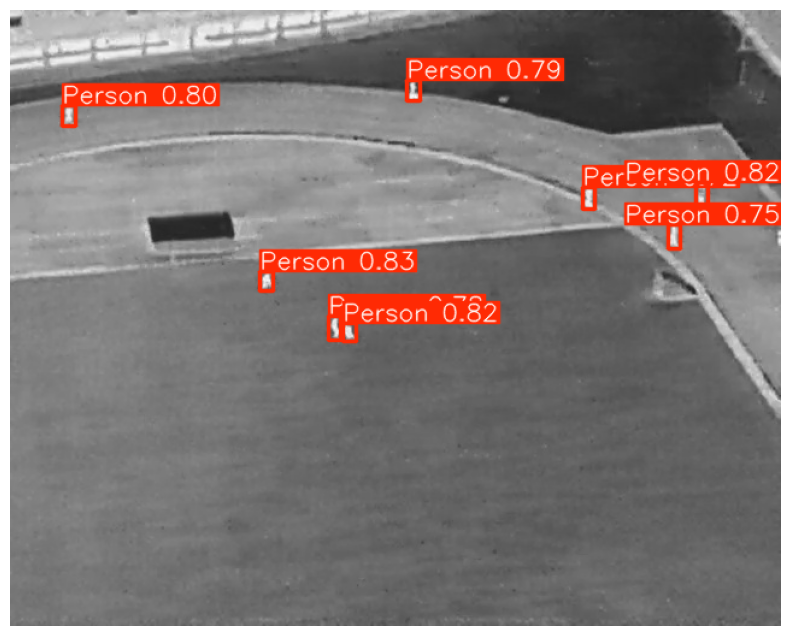

In [18]:
show_random_result(results)

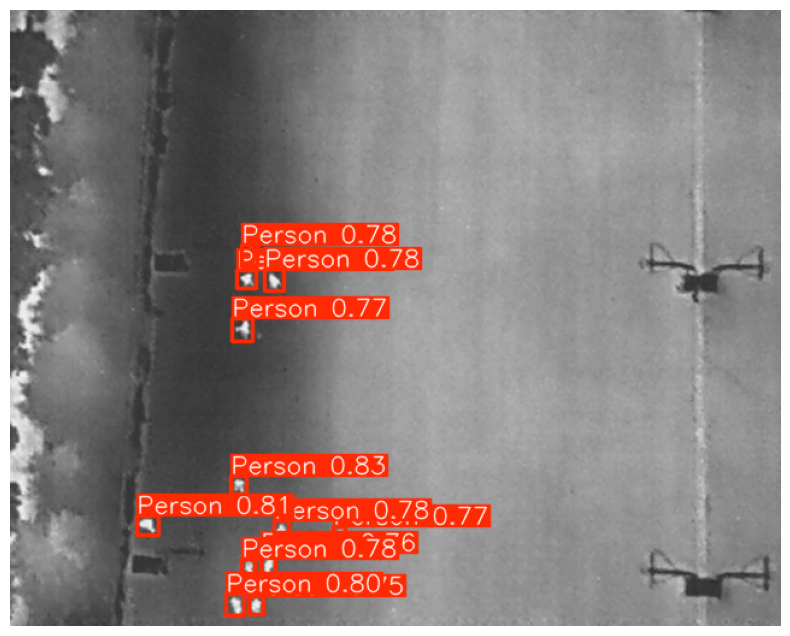

In [19]:
show_random_result(results)

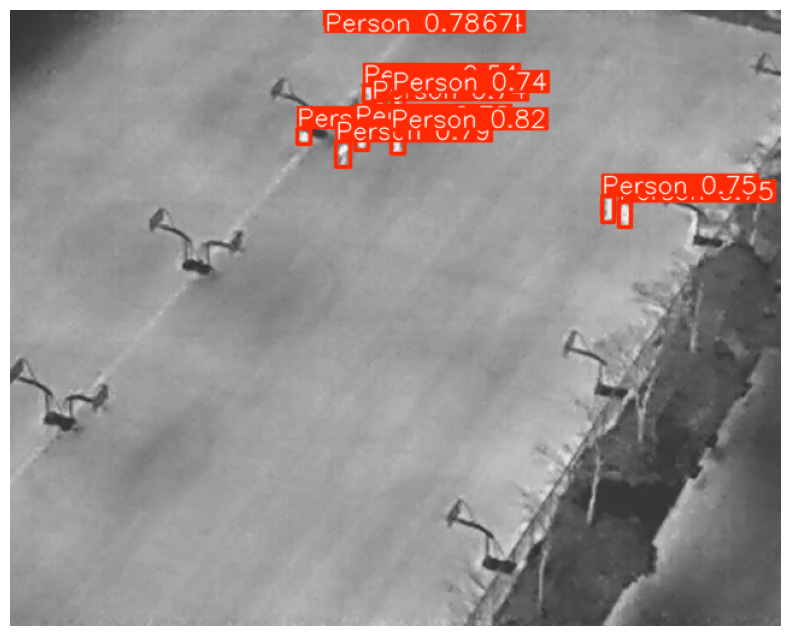

In [20]:

show_random_result(results)

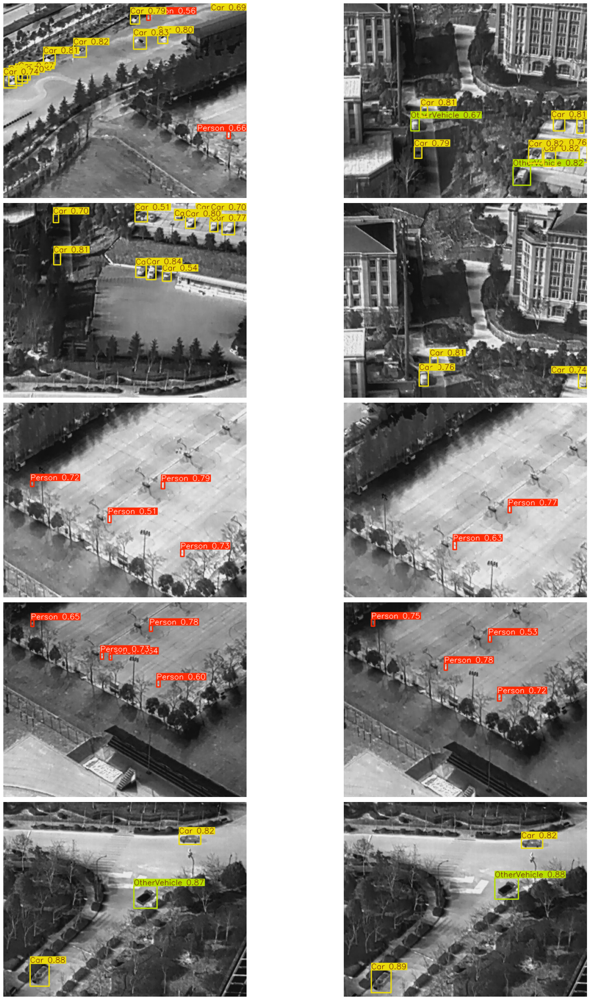

In [21]:
indices = list(range(len(results)))
random_indices = random.sample(indices, 10)
num_cols = 2
num_rows = 5

plt.figure(figsize=(12 * num_cols, 6 * num_rows))
    
for i, idx in enumerate(random_indices):
    image = results[i].plot()
    plt.subplot(num_rows, num_cols, i+1)
    plt.imshow(image)
    plt.axis('off')
plt.tight_layout()
plt.show()


# Compare predictions with ground truth

In [22]:
ground_colors = [(255, 0, 0) for _ in range(len(classes))]

In [23]:
!ls runs/detect

predict  train


In [24]:
success = best_efficientnet_model.export(format="onnx")  # export the model to ONNX format
success

Ultralytics 8.3.233 🚀 Python-3.11.13 torch-2.6.0+cu124 CPU (Intel Xeon CPU @ 2.00GHz)
💡 ProTip: Export to OpenVINO format for best performance on Intel hardware. Learn more at https://docs.ultralytics.com/integrations/openvino/
YOLOv8-custom summary: 369 layers, 92,294,335 parameters, 0 gradients, 238.1 GFLOPs

PyTorch: starting from '/kaggle/working/runs/detect/train/weights/best.pt' with input shape (1, 3, 640, 640) BCHW and output shape(s) (1, 9, 8400) (176.5 MB)
requirements: Ultralytics requirements ['onnxslim>=0.1.71', 'onnxruntime-gpu'] not found, attempting AutoUpdate...
Using Python 3.11.13 environment at: /usr
Resolved 14 packages in 262ms
 Downloaded onnxruntime-gpu
Prepared 4 packages in 3.30s
Installed 4 packages in 11ms
 + coloredlogs==15.0.1
 + humanfriendly==10.0
 + onnxruntime-gpu==1.23.2
 + onnxslim==0.1.77

requirements: AutoUpdate success ✅ 3.9s
WARNING ⚠️ requirements: Restart runtime or rerun command for updates to take effect


ONNX: starting export with onnx 1.1

'/kaggle/working/runs/detect/train/weights/best.onnx'